# **Viola-Jones(картинка)**

In [ ]:
import cv2


In [ ]:

image_path = 'dima.jfif'
classifier_path = cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'

face_cascade = cv2.CascadeClassifier(classifier_path)

image = cv2.imread(image_path)


if image is None:
    print(f"Ошибка: не удалось загрузить изображение по пути {image_path}")
else:
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


    faces = face_cascade.detectMultiScale(
        gray_image,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(30, 30),
        flags=cv2.CASCADE_SCALE_IMAGE
    )


    for (x, y, w, h) in faces:
        cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)

    cv2.imshow('Detected Faces', image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()



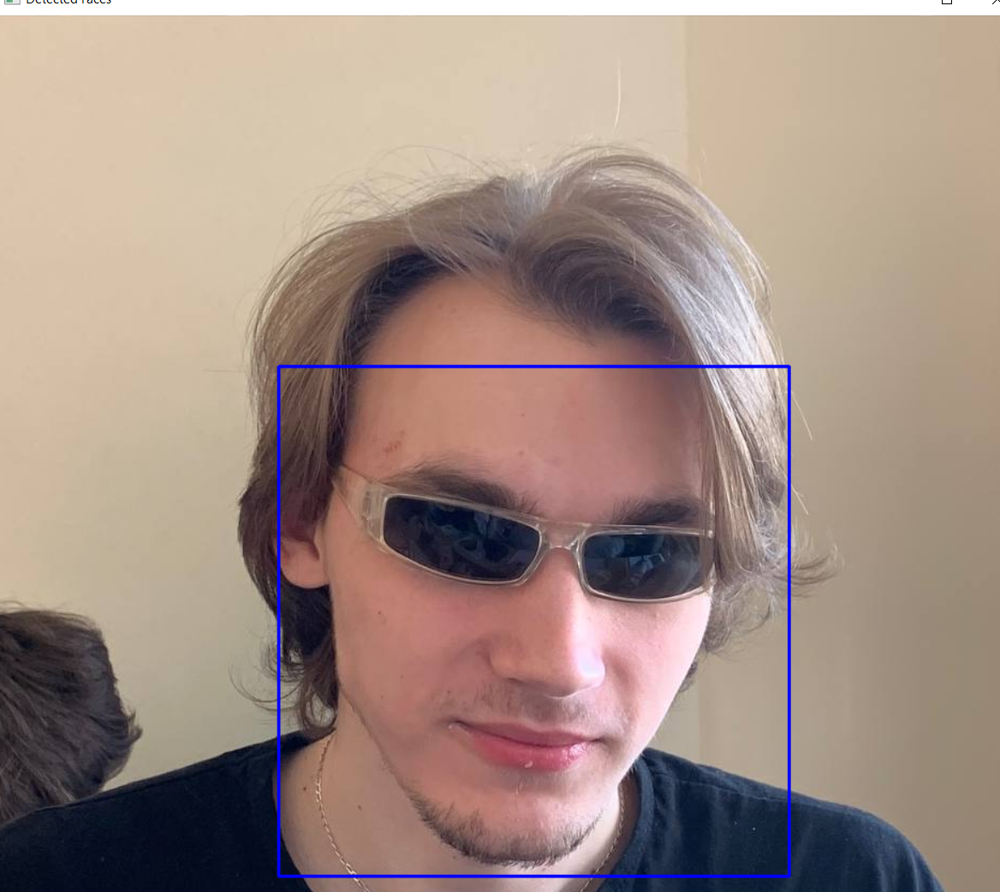

**Вывод:**

Работает неплохо, но если наше исходное изображение начать поворачивать, то оно перестанет распознавать

# **Detectron2**

In [ ]:
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2 import model_zoo

import matplotlib.pyplot as plt
import sys
import time
import cv2
import numpy as np

In [ ]:
#оригинал
class Detector:
    def __init__(self, model_type = "OD"):
        self.cfg = get_cfg()
        self.model_type = model_type

        if model_type == "OD":
            self.cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
            self.cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
        elif model_type =="IS":
            self.cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
            self.cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

        elif model_type =="KP":
            self.cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml"))
            self.cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")

        elif model_type =="LVIS":
            self.cfg.merge_from_file(model_zoo.get_config_file("LVISv0.5-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_1x.yaml"))
            self.cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("LVISv0.5-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_1x.yaml")

        elif model_type =="PS":
            self.cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
            self.cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")

        self.cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
        self.cfg.MODEL.DEVICE = "cuda"

        self.predictor = DefaultPredictor(self.cfg)

    def onImage(self, imagePath):
        image = cv2.imread(imagePath)
        if self.model_type != "PS":
            predictions = self.predictor(image)

            viz = Visualizer(image[:,:,::-1], metadata = MetadataCatalog.get(self.cfg.DATASETS.TRAIN[0]),
            instance_mode = ColorMode.IMAGE)#SEGMENTATION, IMAGE_BW

            output = viz.draw_instance_predictions(predictions["instances"].to("cpu"))

        else:
            predictions, segmentInfo = self.predictor(image)["panoptic_seg"]
            viz = Visualizer(image[:,:,::-1], MetadataCatalog.get(self.cfg.DATASETS.TRAIN[0]))
            output = viz.draw_panoptic_seg_predictions(predictions.to("cpu"), segmentInfo)

        plt.figure(figsize=(12, 8))
        plt.imshow(output.get_image()[:, :, ::-1])
        plt.axis('off')
        plt.show()

    def onVideo(self, videoPath, outputPath):
        cap = cv2.VideoCapture(videoPath)
        if not cap.isOpened():
            print("Error: Could not open video.")
            return


        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        print(f"Total number of frames: {total_frames}")

        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = int(cap.get(cv2.CAP_PROP_FPS))


        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out = cv2.VideoWriter(outputPath, fourcc, fps, (width, height))
        start_time = time.time()

        (success, image) = cap.read()
        frame_count = 0
        while success:
            frame_start_time = time.time()
            if self.model_type != "PS":
                predictions = self.predictor(image)

                viz = Visualizer(image[:, :, ::-1], metadata=MetadataCatalog.get(self.cfg.DATASETS.TRAIN[0]),
                             instance_mode=ColorMode.IMAGE)  # SEGMENTATION, IMAGE_BW
                output = viz.draw_instance_predictions(predictions["instances"].to("cpu"))
            else:
                predictions, segmentInfo = self.predictor(image)["panoptic_seg"]
                viz = Visualizer(image[:, :, ::-1], MetadataCatalog.get(self.cfg.DATASETS.TRAIN[0]))
                output = viz.draw_panoptic_seg_predictions(predictions.to("cpu"), segmentInfo)


            result_frame = output.get_image()[:, :, ::-1]
            out.write(result_frame)

            frame_end_time = time.time()
            frame_elapsed_time = frame_end_time - frame_start_time

            sys.stdout.write(f"\rFrame {frame_count}/{total_frames}: {frame_elapsed_time:.2f} seconds")
            sys.stdout.flush()
            frame_count += 1

            (success, image) = cap.read()

        end_time = time.time()
        total_elapsed_time = end_time - start_time

        print(f"Total processing time: {total_elapsed_time/60:.2f} minutes -/ total_frames")

        cap.release()
        out.release()


**Object Detection**

In [ ]:
detector_od = Detector(model_type='OD')

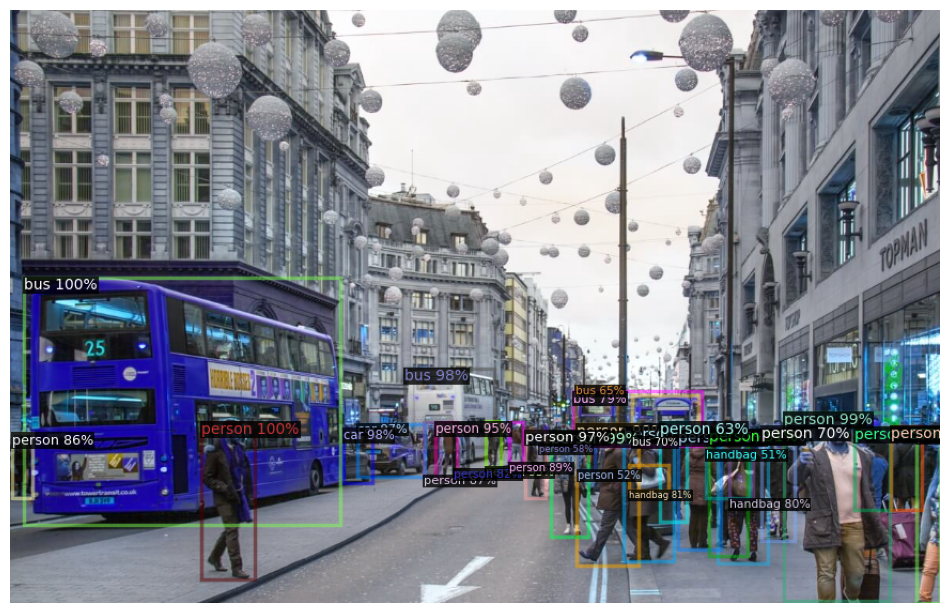

In [ ]:
detector_od.onImage("eur.png")

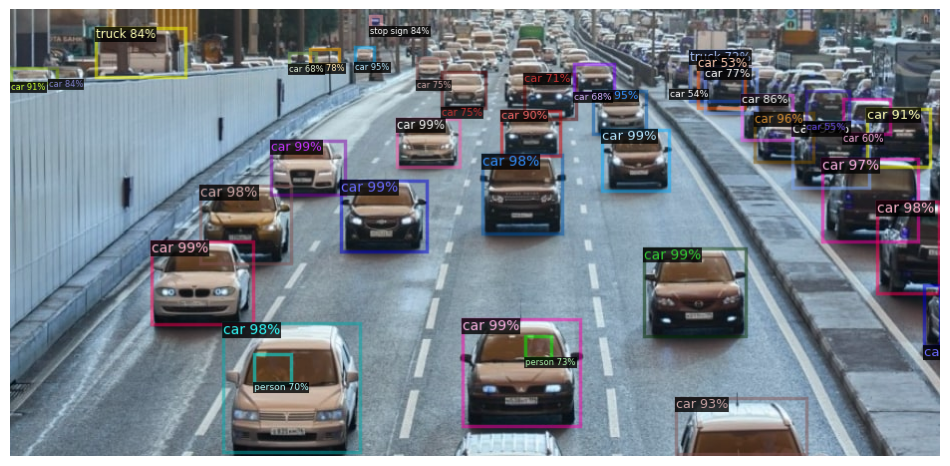

In [ ]:
detector_od.onImage("cars.jpg")

**Instance Segmentation**

In [ ]:
detector_is = Detector(model_type='IS')

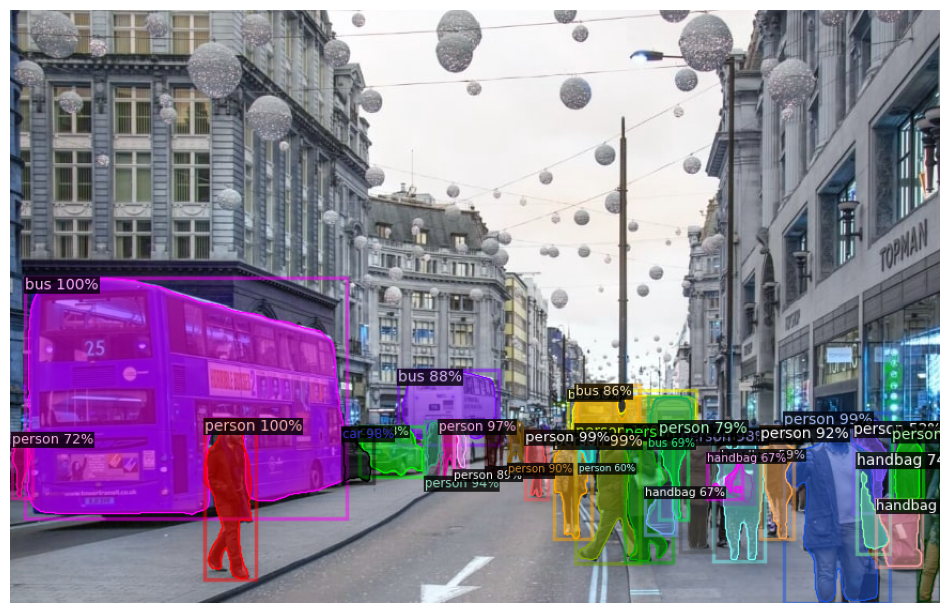

In [ ]:
detector_is.onImage("eur.jpg")

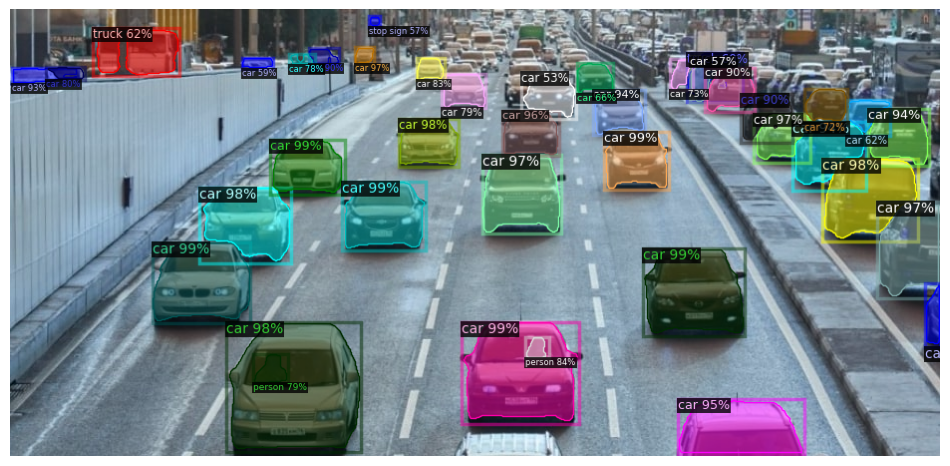

In [ ]:
detector_is.onImage("cars.jpg")

**Keypoints**

In [ ]:
detector_kp = Detector(model_type='KP')

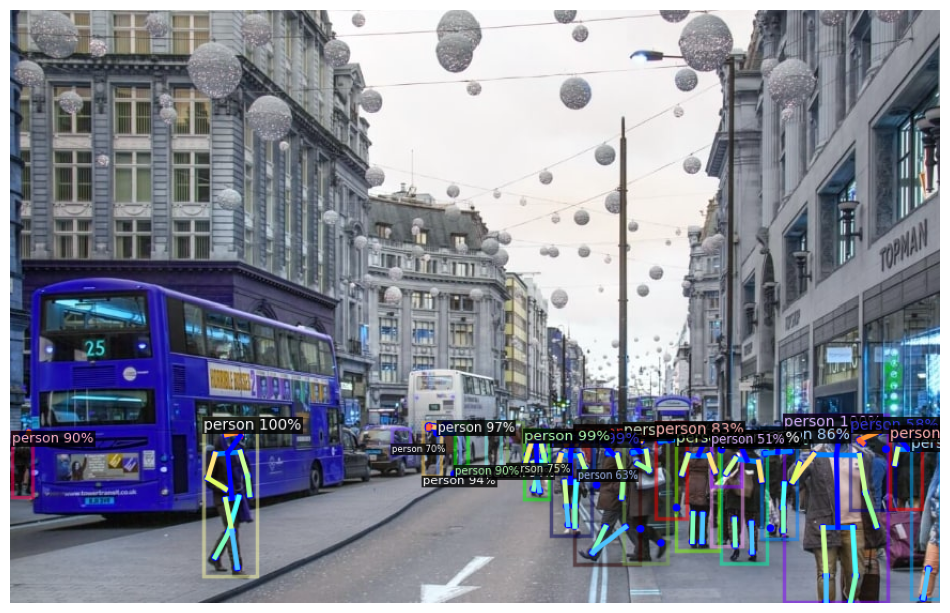

In [ ]:
detector_kp.onImage("eur.jpg")

**LVIS**

In [ ]:
detector_lvis = Detector(model_type='LVIS')

**Panoptic Segmentation**

In [ ]:
detector_ps = Detector(model_type='PS')

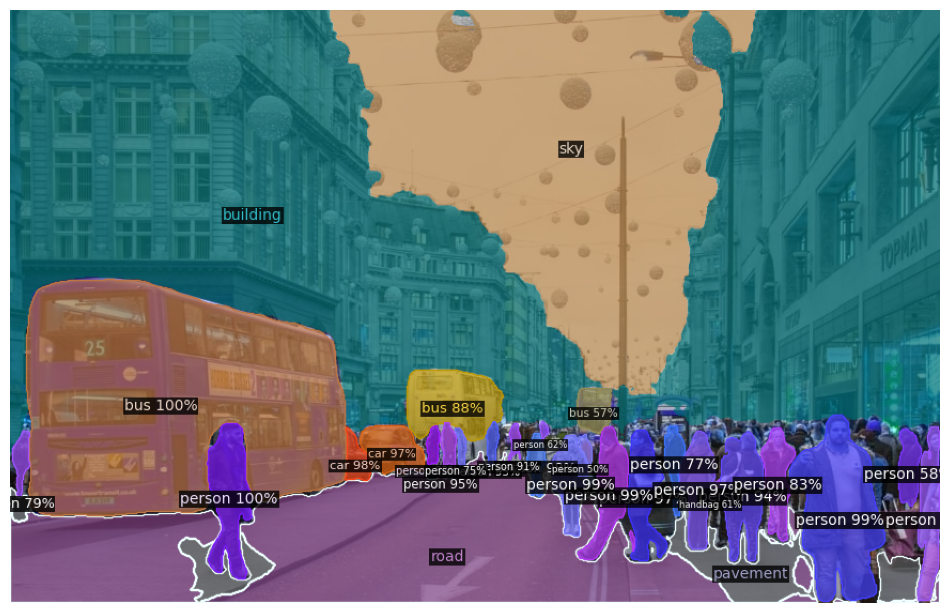

In [ ]:
detector_ps.onImage("eur.jpg")

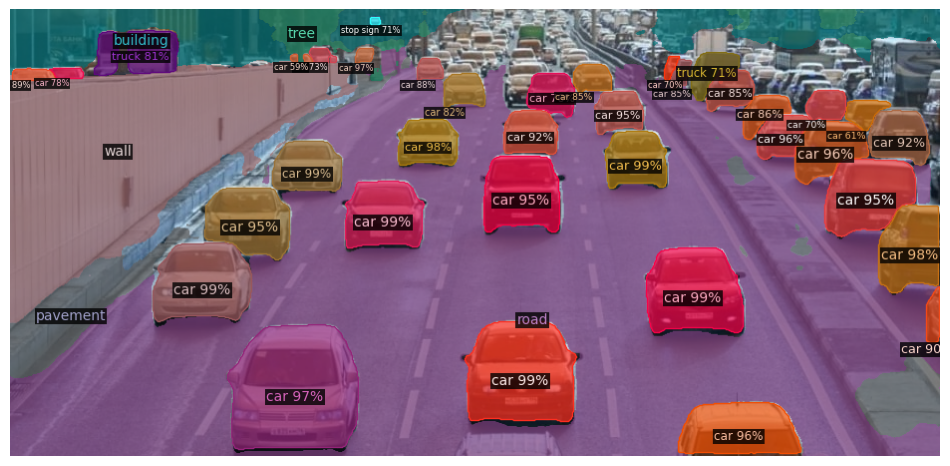

In [ ]:
detector_ps.onImage("cars.jpg")

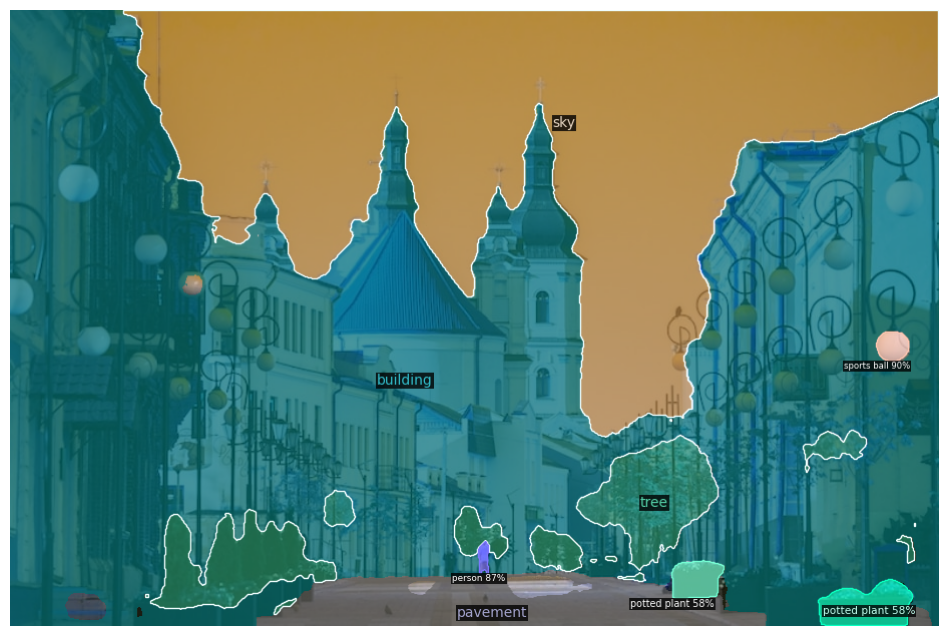

In [ ]:
detector_ps.onImage("pinsk.jpg")

**Видео**

In [ ]:
detector_od.onVideo("cars.mp4", "cars_res_od.mp4")

Total number of frames: 461
Frame 460/461: 0.23 secondsTotal processing time: 2.39 minutes -/ total_frames


In [ ]:
detector_is.onVideo("cars.mp4", "cars_res_is.mp4")

Total number of frames: 461
Frame 460/461: 0.19 secondsTotal processing time: 3.02 minutes -/ total_frames


In [ ]:
detector_ps.onVideo("cars.mp4", "cars_res_ps.mp4")

Total number of frames: 461
Frame 460/461: 0.36 secondsTotal processing time: 8.94 minutes -/ total_frames


In [ ]:
detector_lvis.onVideo("cars.mp4", "cars_res_lvis.mp4")

Total number of frames: 461
Frame 460/461: 0.36 secondsTotal processing time: 2.90 minutes -/ total_frames


In [ ]:
detector_kp.onVideo("people.mp4", "people_res_kp.mp4")

Total number of frames: 341
Frame 340/341: 1.47 secondsTotal processing time: 9.55 minutes -/ total_frames


**Вывод:**

Работает хорошо, есть различные модификации, но есть минусы - при обработке видео тратиться много времени, даже на GPU(самый обычный OD оюраюатывает 2.39 минуты), иногда находил объекты, которых не было(это было всего на какие то 1-2 секунды, я думаю не кретично наверное)

# **SSD**

**Видео**

In [ ]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image

import sys
import time
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Загрузка предобученной SSD модели
model_ssd = torchvision.models.detection.ssd300_vgg16(pretrained=True)
model_ssd = model_ssd.to(device)
model_ssd.eval()

C:\Users\vlade\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\vlade\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SSD300_VGG16_Weights.COCO_V1`. You can also use `weights=SSD300_VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
])

In [ ]:
COCO__NAMES = [
    '__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A', 'stop sign',
    'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant',
    'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'N/A', 'handbag',
    'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat',
    'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli',
    'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'N/A',
    'dining table', 'N/A', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A', 'book', 'clock',
    'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush'
]

In [ ]:
def ssd_dt(video_path, res, model):

    cap = cv2.VideoCapture(video_path)

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(res, fourcc, fps, (width, height))
    start_time = time.time()

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total number of frames: {total_frames}")

    success, frame = cap.read()
    frame_count = 0

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    model.eval()

    while success:
        frame_start_time = time.time()
        image = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        image = transform(image).unsqueeze(0)

        image = image.to(device=device, dtype=torch.float32)

        with torch.no_grad():
            predictions = model(image)

        pred_classes = [COCO__NAMES[i] for i in predictions[0]['labels'].cpu().numpy()]
        pred_scores = predictions[0]['scores'].cpu().detach().numpy()
        pred_boxes = predictions[0]['boxes'].cpu().detach().numpy()

        for i, (box, score, cls) in enumerate(zip(pred_boxes, pred_scores, pred_classes)):
            if score > 0.2:
                startX, startY, endX, endY = box.astype(int)
                cv2.rectangle(frame, (startX, startY), (endX, endY), (255, 0, 0), 2)
                label = f'{cls}: {score:.2f}'
                cv2.putText(frame, label, (startX, startY - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        out.write(frame)
        frame_end_time = time.time()
        frame_elapsed_time = frame_end_time - frame_start_time

        frame_count += 1
        sys.stdout.write(f"\rFrame {frame_count}/{total_frames}: {frame_elapsed_time:.2f} seconds")
        sys.stdout.flush()

        success, frame = cap.read()

    cap.release()
    out.release()

    end_time = time.time()
    total_elapsed_time = end_time - start_time
    print(f"Total processing time: {total_elapsed_time/60:.2f} minutes for {total_frames} frames")


In [ ]:
ssd_dt("cars.mp4", "cars_ssd.mp4",model_ssd)

Total number of frames: 461
Frame 461/461: 0.07 secondsTotal processing time: 0.65 minutes for 461 frames


In [ ]:
ssd_dt("people.mp4", "people_ssd.mp4",model_ssd)

Total number of frames: 341
Frame 341/341: 0.10 secondsTotal processing time: 0.50 minutes for 341 frames


**Фотографии**

In [ ]:
import torch
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import cv2


ssd_model = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd')
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd_processing_utils')

Using cache found in C:\Users\vlade/.cache\torch\hub\NVIDIA_DeepLearningExamples_torchhub
C:\Users\vlade/.cache\torch\hub\NVIDIA_DeepLearningExamples_torchhub\PyTorch\Classification\ConvNets\image_classification\models\common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
C:\Users\vlade/.cache\torch\hub\NVIDIA_DeepLearningExamples_torchhub\PyTorch\Classification\ConvNets\image_classification\models\efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
Using cache found in C:\Users\vlade/.cache\torch\hub\NVIDIA_DeepLearningExamples_torchhub


In [ ]:
ssd_model.to('cuda')
ssd_model.eval()

SSD300(
  (feature_extractor): ResNet(
    (feature_extractor): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplac

In [ ]:
uris = [
    'eur.jpg',
    'cars.jpg',
    'pinsk.jpg'
]

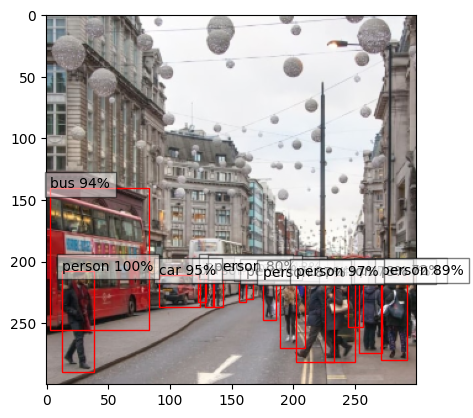

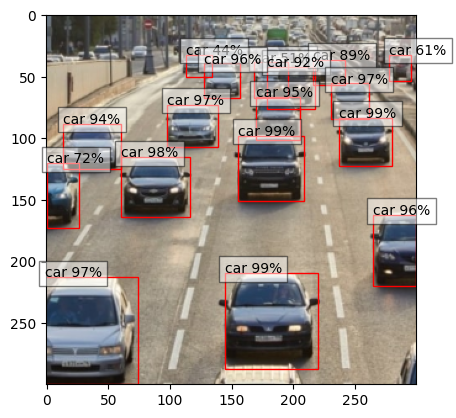

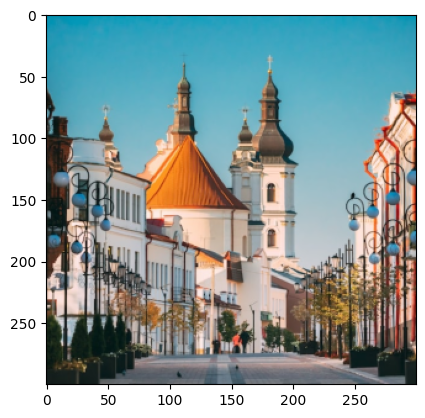

In [ ]:
inputs = [utils.prepare_input(uri) for uri in uris]
tensor = utils.prepare_tensor(inputs)

with torch.no_grad():
    detections_batch = ssd_model(tensor)

results_per_input = utils.decode_results(detections_batch)
best_results_per_input = [utils.pick_best(results, 0.35) for results in results_per_input]

classes_to_labels = utils.get_coco_object_dictionary()

for image_idx in range(len(best_results_per_input)):
    fig, ax = plt.subplots(1)
    # Show original, denormalized image...
    image = inputs[image_idx] / 2 + 0.5
    ax.imshow(image)
    # ...with detections
    bboxes, classes, confidences = best_results_per_input[image_idx]
    for idx in range(len(bboxes)):
        left, bot, right, top = bboxes[idx]
        x, y, w, h = [val * 300 for val in [left, bot, right - left, top - bot]]
        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(x, y, "{} {:.0f}%".format(classes_to_labels[classes[idx] - 1], confidences[idx]*100), bbox=dict(facecolor='white', alpha=0.5))
plt.show()


**Вывод:**

Видео отрабатывал быстрее, чем Detectron2, но точность была намного хуже(в видео с машинами). Пришлось score поставить 0,2 и в этом случае он начал раюотать лучше, но находил объекты которых не было. С людьми он сработал лучше.
Только на одной картинке он ничего не смог распознать.

# **YOLO**

**Фотографии**

In [ ]:
from ultralytics import YOLO
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import os

In [ ]:
model = YOLO("yolov8n.yaml")
model = YOLO("yolov8n.pt")
model.to('cuda')

100%|█████████████████████████████████████████████████████████████████████████████| 6.25M/6.25M [00:00<00:00, 8.87MB/s]


YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s


0: 640x640 29 cars, 70.3ms
1: 640x640 14 persons, 2 cars, 2 buss, 1 handbag, 70.3ms
2: 640x640 2 persons, 70.3ms
Speed: 8.0ms preprocess, 70.3ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 29 cars, 5.7ms
1: 640x640 14 persons, 2 cars, 2 buss, 1 handbag, 5.7ms
2: 640x640 2 persons, 5.7ms
Speed: 5.0ms preprocess, 5.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 29 cars, 5.7ms
1: 640x640 14 persons, 2 cars, 2 buss, 1 handbag, 5.7ms
2: 640x640 2 persons, 5.7ms
Speed: 4.3ms preprocess, 5.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


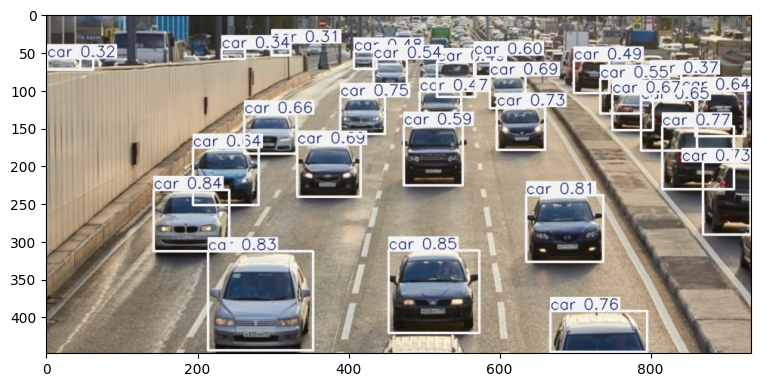

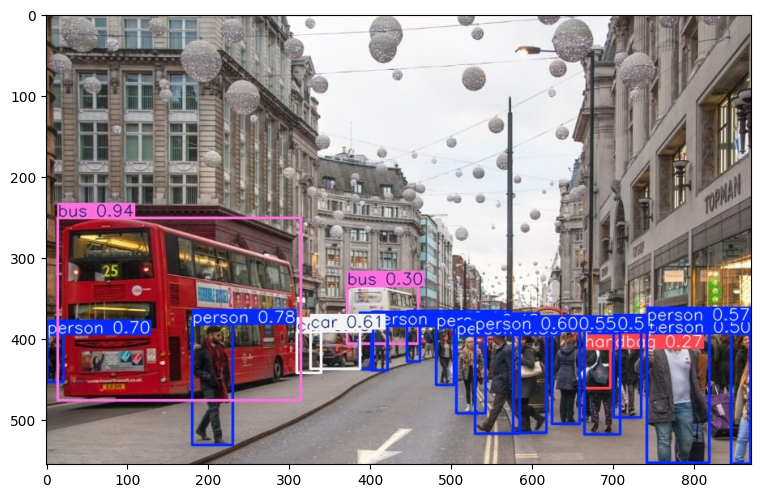

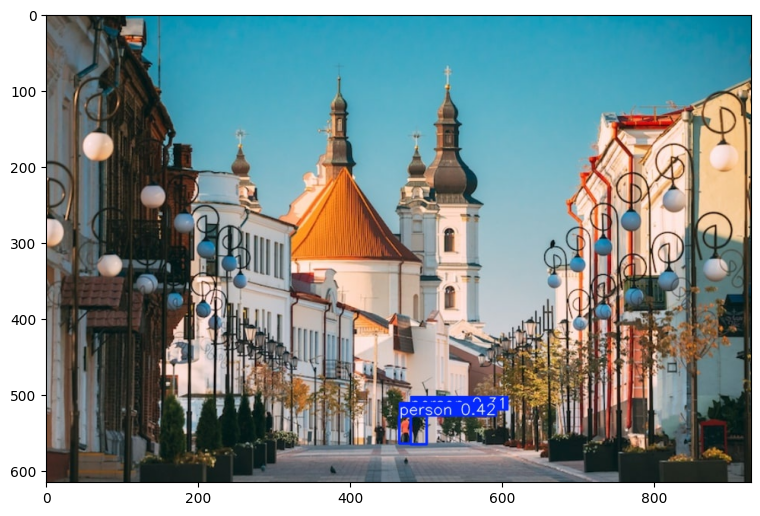

In [ ]:
image_paths = [
    'cars.jpg',
    'eur.jpg',
    'pinsk.jpg'
]

pr_obj = []
img_pred = []

for i in range(len(image_paths)):
  results = model.predict(image_paths)
  result = results[0]
  img_pred.append(result)
  pr_obj = []

src = 'yolo_res/'
files = os.listdir(src)

for idx, image_src in enumerate(files):
  image = Image.open(f'{src}{image_src}',"r")
  plt.figure(figsize=(20,50))
  plt.subplot(4, 2, idx+1)
  plt.imshow(image)

plt.show()

**Видео**

In [ ]:
from ultralytics import YOLO
import cv2
import math

In [ ]:
model = YOLO("yolo-Weights/yolov8n-seg.pt")
model.to('cuda')

# Список классов объектов
classNames = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck", "boat",
              "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat",
              "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "backpack", "umbrella",
              "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", "sports ball", "kite", "baseball bat",
              "baseball glove", "skateboard", "surfboard", "tennis racket", "bottle", "wine glass", "cup",
              "fork", "knife", "spoon", "bowl", "banana", "apple", "sandwich", "orange", "broccoli",
              "carrot", "hot dog", "pizza", "donut", "cake", "chair", "sofa", "pottedplant", "bed",
              "diningtable", "toilet", "tvmonitor", "laptop", "mouse", "remote", "keyboard", "cell phone",
              "microwave", "oven", "toaster", "sink", "refrigerator", "book", "clock", "vase", "scissors",
              "teddy bear", "hair drier", "toothbrush"
              ]

In [ ]:

def yolo_video(input_video_path, output_video_path):

    cap = cv2.VideoCapture(input_video_path)

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total number of frames: {total_frames}")

    frame_width = int(cap.get(3))
    frame_height = int(cap.get(4))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))
    start_time = time.time()

    frame_count = 0
    while True:
        success, img = cap.read()
        frame_start_time = time.time()
        if not success:
            break

        results = model(img, verbose=False)

        # Координаты
        for r in results:
            boxes = r.boxes

            for box in boxes:

                x1, y1, x2, y2 = box.xyxy[0]
                x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)


                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 2)

                confidence = math.ceil((box.conf[0] * 100)) / 100

                cls = int(box.cls[0])

                org = [x1, y1]
                font = cv2.FONT_HERSHEY_SIMPLEX
                fontScale = 0.5
                color = (153, 0, 0)
                thickness = 2
                text = f"{classNames[cls]} {confidence:.2f}"
                cv2.putText(img, text, org, font, fontScale, color, thickness)

        out.write(img)
        frame_end_time = time.time()
        frame_elapsed_time = frame_end_time - frame_start_time
        sys.stdout.write(f"\rFrame {frame_count}/{total_frames}: {frame_elapsed_time:.3f} seconds")
        sys.stdout.flush()
        frame_count += 1

    end_time = time.time()
    total_elapsed_time = end_time - start_time

    print(f"\nTotal processing time: {total_elapsed_time/60:.2f} minutes -/ total_frames")
    cap.release()
    out.release()

In [ ]:
yolo_video('cars.mp4', 'cars_yolo.mp4')

Total number of frames: 461
Frame 460/461: 0.015 seconds
Total processing time: 0.19 minutes -/ total_frames


In [ ]:
yolo_video('people.mp4', 'people_yolo.mp4')

Total number of frames: 341
Frame 340/341: 0.062 seconds
Total processing time: 0.22 minutes -/ total_frames


**Вывод:**

Картинки отработала почти как Detectron2, но была чуть хуже. На видео отработала также как и Detectron2, только детекция лишних объектов была меньше.
Так же была высокая скорость отрабатывания меньше полминуты.